### Import packages

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import copy
import math

%matplotlib inline

In [5]:
# pip install ydata-profiling
from ydata_profiling import ProfileReport

### Read data

In [7]:
data = pd.read_csv("heart_statlog_cleveland_hungary_final.csv", thousands=',', skipinitialspace=True)
#data = pd.read_csv("churn-bigml-80.csv", thousands=',', skipinitialspace=True)
data

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1185,45,1,1,110,264,0,0,132,0,1.2,2,1
1186,68,1,4,144,193,1,0,141,0,3.4,2,1
1187,57,1,4,130,131,0,0,115,1,1.2,2,1
1188,57,0,2,130,236,0,2,174,0,0.0,2,1


### Drop empty lines in data and remove NAN's

In [8]:
data = data.dropna()
data

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,40,1,2,140,289,0,0,172,0,0.0,1,0
1,49,0,3,160,180,0,0,156,0,1.0,2,1
2,37,1,2,130,283,0,1,98,0,0.0,1,0
3,48,0,4,138,214,0,0,108,1,1.5,2,1
4,54,1,3,150,195,0,0,122,0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1185,45,1,1,110,264,0,0,132,0,1.2,2,1
1186,68,1,4,144,193,1,0,141,0,3.4,2,1
1187,57,1,4,130,131,0,0,115,1,1.2,2,1
1188,57,0,2,130,236,0,2,174,0,0.0,2,1


### Reset the index for potentially removed rows in data

In [10]:
data = data.reset_index(drop=True)

## EDA - Exploratory Data Analysis

### View data statistics - short format

In [11]:
data.describe()

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
count,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000
mean,53.720168,0.763866,3.232773,132.153782,210.363866,0.213445,0.698319,139.732773,0.387395,0.922773,1.624370,0.528571
std,9.358203,0.424884,0.935480,18.368823,101.420489,0.409912,0.870359,25.517636,0.487360,1.086337,0.610459,0.499393
min,28.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000
25%,47.000000,1.000000,3.000000,120.000000,188.000000,0.000000,0.000000,121.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,4.000000,130.000000,229.000000,0.000000,0.000000,140.500000,0.000000,0.600000,2.000000,1.000000
75%,60.000000,1.000000,4.000000,140.000000,269.750000,0.000000,2.000000,160.000000,1.000000,1.600000,2.000000,1.000000
max,77.000000,1.000000,4.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,1.000000


### View data statistics - long format

In [12]:
profile = ProfileReport(data, title="Heart Desease")

In [13]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Important: We have 85.8% samples with no churn and 14.2% churn samples in our dataset

### Change categorical string/boolean columns to categorical integer columns

In [16]:
data['age'] = data['age'].astype('category').cat.codes
data['ST slope'] = data['ST slope'].astype('category').cat.codes
data['exercise angina'] = data['exercise angina'].astype('category').cat.codes
data['target'] = data['target'].astype('category').cat.codes

In [17]:
data

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope,target
0,12,1,2,140,289,0,0,172,0,0.0,1,0
1,21,0,3,160,180,0,0,156,0,1.0,2,1
2,9,1,2,130,283,0,1,98,0,0.0,1,0
3,20,0,4,138,214,0,0,108,1,1.5,2,1
4,26,1,3,150,195,0,0,122,0,0.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1185,17,1,1,110,264,0,0,132,0,1.2,2,1
1186,40,1,4,144,193,1,0,141,0,3.4,2,1
1187,29,1,4,130,131,0,0,115,1,1.2,2,1
1188,29,0,2,130,236,0,2,174,0,0.0,2,1


### Create x and y from original data

In [19]:
x_data = data.drop(columns=['target'])
x_data

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,ST slope
0,12,1,2,140,289,0,0,172,0,0.0,1
1,21,0,3,160,180,0,0,156,0,1.0,2
2,9,1,2,130,283,0,1,98,0,0.0,1
3,20,0,4,138,214,0,0,108,1,1.5,2
4,26,1,3,150,195,0,0,122,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...
1185,17,1,1,110,264,0,0,132,0,1.2,2
1186,40,1,4,144,193,1,0,141,0,3.4,2
1187,29,1,4,130,131,0,0,115,1,1.2,2
1188,29,0,2,130,236,0,2,174,0,0.0,2


In [20]:
y_data = data[['target']]
y_data

,target
0,0
1,1
2,0
3,1
4,0
...,...
1185,1
1186,1
1187,1
1188,1


### View features against Churn

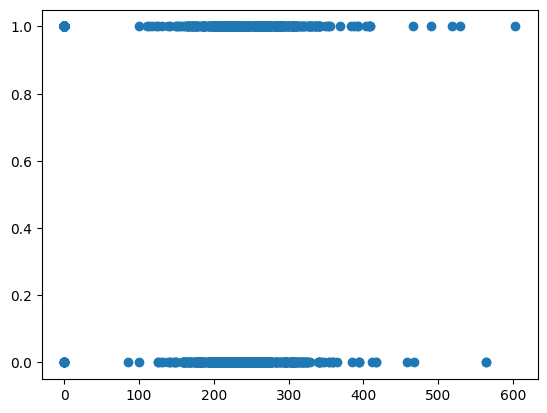

In [21]:
plt.scatter(x_data['cholesterol'], y_data)

### Split data into training and validation datasets: Default 80% train, 20% validation

In [22]:
def train_validation_split(x, y, validation_size=0.2, random_state=None):
    x_validation = x.sample(frac=validation_size, random_state=random_state)
    y_validation = y.iloc[x_validation.index]
    
    x_train = x.drop(x_validation.index)
    y_train = y.drop(y_validation.index)

    return np.array(x_train), np.array(y_train), np.array(x_validation), np.array(y_validation)

In [23]:
x_train, y_train, x_validation, y_validation = train_validation_split(x_data, y_data, validation_size=0.2, random_state=0)

### Visualize how one sample looks like

In [24]:
x_train[0]

array([ 12.,   1.,   2., 140., 289.,   0.,   0., 172.,   0.,   0.,   1.])

### Visualize the nuber of training samples and number of validation samples

In [25]:
len(y_train), len(y_validation)

(952, 238)

### Visualize the number of no target vs target samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [26]:
np.unique(y_train, return_counts=1)

(array([0, 1], dtype=int8), array([452, 500], dtype=int64))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [27]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int8), array([109, 129], dtype=int64))

### Standardization - mean and standard deviation calculation

In [28]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [29]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [30]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [31]:
x_train.min(), x_train.max()

(-7.122339121470387, 4.817398482646073)

### View min and max values after standardization from training dataset

In [32]:
x_validation.min(), x_validation.max()

(-2.6078109035369796, 4.817398482646073)

### Logistic Regression implementation

In [33]:
def sigmoid(x):
    g = 1 / (1 + np.exp(-x))
    return g

#### Examples of using sigmoid values

In [34]:
sigmoid(1)

0.7310585786300049

In [35]:
sigmoid(0)

0.5

In [36]:
sigmoid(-1)

0.2689414213699951

In [37]:
sigmoid(-1000)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\3992194360.py:2: RuntimeWarning: overflow encountered in exp
  g = 1 / (1 + np.exp(-x))


0.0

In [38]:
sigmoid(100)

1.0

In [39]:
def compute_cost(X, y, w, b, lambda_=1):
    m = X.shape[0]
    cost = 0.0
    for i in range(m):
        z_i = np.dot(X[i],w) + b
        f_wb_i = sigmoid(z_i)
        cost +=  -y[i] * np.log(f_wb_i) - (1 - y[i]) * np.log(1 - f_wb_i) 
             
    cost = cost / m
    return cost

In [40]:
def compute_gradient(X, y, w, b, lambda_=1):
    m,n = X.shape
    dj_dw = np.zeros((n,))                           #(n,)
    dj_db = 0.

    for i in range(m):
        f_wb_i = sigmoid(np.dot(X[i], w) + b)          #(n,)(n,)=scalar
        err_i  = f_wb_i  - y[i]                       #scalar
        for j in range(n):
            dj_dw[j] += err_i * X[i,j]      #scalar
        dj_db += err_i
    dj_dw = dj_dw/m                                   #(n,)
    dj_db = dj_db/m                                   #scalar
        
    return dj_db, dj_dw

In [41]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [42]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 3
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\2253367060.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += err_i * X[i,j]      #scalar


Iteration    0: Cost Train: 0.406321 	  Cost Validation: 0.408756
Iteration  100: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  200: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  300: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  400: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  500: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  600: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  700: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  800: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  900: Cost Train: 0.383039 	  Cost Validation: 0.414881
Iteration  999: Cost Train: 0.383039 	  Cost Validation: 0.414881


In [43]:
best_w_final = np.load('model/best_valid_w_in.npy')
best_b_final = np.load('model/best_valid_b.npy')

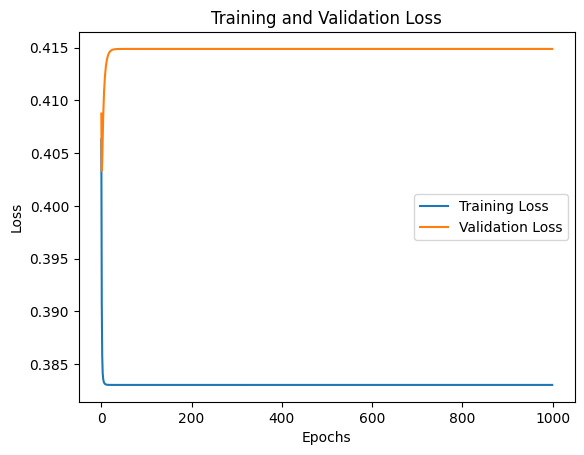

In [44]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()  ## Observatie: merge rau pe validation,se observa o validation loss foarte mare => modelul meu este in zona dwe  overfit,adica merge ok pe 
            ## training,dar foarte rau pe validation,practic imi memoreaza setul de date pt training

In [45]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [46]:
y_predicted = predict(x_train, w_final, b_final)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [47]:
y_train.shape

(952, 1)

In [48]:
y_train.reshape(-1).shape, y_predicted.shape

((952,), (952,))

In [49]:
(y_train.reshape(-1) == y_predicted).sum()

799

In [50]:
x_train.shape
x_train.shape

(952, 11)

In [51]:
y_train = y_train.reshape(-1)

In [52]:
type(y_predicted)

numpy.ndarray

In [53]:
def metrics_computations(x:np.array,
                         y_true:np.array,
                         y_predicted: np.array):
    total_number_of_samples = x.shape[0]
    accuracy = (y_true == y_predicted).sum() / total_number_of_samples
    true_positive = ((y_predicted == 1) & (y_true == 1)).sum()
    false_positive = ((y_predicted == 1) & (y_true == 0)).sum()
    false_negative = ((y_predicted == 0) & (y_true == 1)).sum()
    true_negative = ((y_predicted == 0) & (y_true == 0)).sum()
    
    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)
    f1_score = (2 * precision * recall) / (precision + recall)
    
    false_negative_rate = false_negative / (false_negative + true_positive)
    false_positive_rate = false_positive / (false_positive + true_negative)

    return (accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate)

In [54]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [55]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")
# ce se observa pe train,aparent merge destul de bine setul de date,f1 score destul de mare,acuratetea la fel,pe 17.26% din pacienti care sunt sanatosi ii pune ca bolnavi
#ceea ce e un scor destul de ridicat parerea mea,la fel pe 15%din bolnavi ii ia ca fiind sanatosi

[TRAIN] Accuracy: 83.93% 
 Precision: 84.49% 
 Recall: 85.00% 
 F1 Score: 84.75% 
 Specificity: 82.74% 
 False Positive Rate: 17.26% 
 False Negative Rate: 15.00%


In [56]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 83.93% 
 Precision: 84.49% 
 Recall: 85.00% 
 F1 Score: 84.75% 
 Specificity: 82.74% 
 False Positive Rate: 17.26% 
 False Negative Rate: 15.00%


In [57]:
y_predicted_validation = predict(x_validation, w_final, b_final)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [58]:
y_validation = y_validation.reshape(-1)

In [59]:
for i, j in zip(y_validation, y_predicted_validation):
    print(i, j)

1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 0.0
1 1.0
0 1.0
0 0.0
0 0.0
1 1.0
1 1.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
1 0.0
1 1.0
1 0.0
1 1.0
1 1.0
1 0.0
0 1.0
0 0.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
1 1.0
1 1.0
0 1.0
1 1.0
0 1.0
1 1.0
0 0.0
0 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 0.0
0 0.0
1 0.0
1 1.0
1 1.0
1 0.0
0 0.0
1 1.0
0 1.0
1 0.0
0 1.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
1 1.0
0 1.0
1 0.0
0 0.0
1 1.0
1 1.0
1 1.0
1 1.0
0 0.0
0 0.0
0 0.0
1 0.0
1 1.0
1 1.0
0 0.0
0 1.0
0 1.0
0 1.0
1 0.0
1 1.0
1 1.0
0 0.0
1 1.0
1 0.0
1 0.0
1 0.0
0 0.0
1 0.0
1 1.0
1 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
1 0.0
1 1.0
0 1.0
0 0.0
0 0.0
1 1.0
0 1.0
1 1.0
0 0.0
1 1.0
1 1.0
0 0.0
0 0.0
0 0.0
1 1.0
0 0.0
0 0.0
0 0.0
1 1.0
1 1.0
1 1.0
0 1.0
1 0.0
1 0.0
1 1.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
1 0.0
0 0.0
0 0.0
0 0.0
0 0.0
0 0.0
1 1.0
1 1.0
0 1.0
0 0.0
1 1.0
1 1.0
1 1.0
1 0.0
1 0.0
0 1.0
1 1.0
0 0.0
0 0.0
1 1.0
1 1.0
1 1.

In [60]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [61]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")
#observatii: f1 score este 81.4%,ce este peste 70%,in mod normal este o valoare buna,deci si pentru setul meu de date e o valoare buna,false pozitivity rate-ul este destul de mare,la fel si false negative
#as recomanda sa se refaca testul in cazul bolnavului

[Valid] Accuracy: 79.83% 
 Precision: 81.40% 
 Recall: 81.40% 
 F1 Score: 81.40% 
 Specificity: 77.98% 
 False Positive Rate: 22.02% 
 False Negative Rate: 18.60%


In [62]:
print(f"[Valid] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[Valid] Accuracy: 79.83% 
 Precision: 81.40% 
 Recall: 81.40% 
 F1 Score: 81.40% 
 Specificity: 77.98% 
 False Positive Rate: 22.02% 
 False Negative Rate: 18.60%


### Analyze the feature importance

<Axes: ylabel='Feature'>

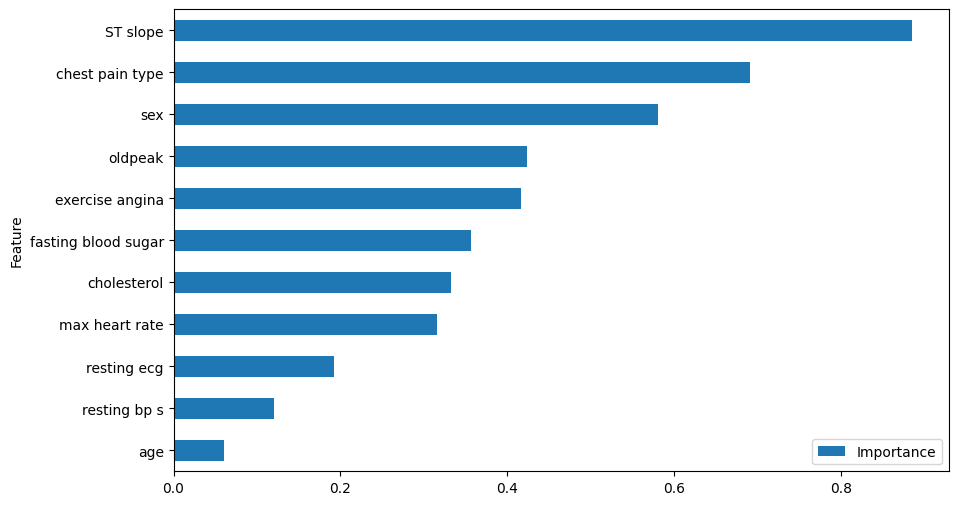

In [63]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

### Add polynomial features for improving model capacity

In [64]:
#pip install scikit-learn
from sklearn import preprocessing

In [65]:
poly = preprocessing.PolynomialFeatures(2, interaction_only=False, include_bias=False)

In [66]:
poly_values = poly.fit_transform(x_data)
poly_values

array([[12.  ,  1.  ,  2.  , ...,  0.  ,  0.  ,  1.  ],
       [21.  ,  0.  ,  3.  , ...,  1.  ,  2.  ,  4.  ],
       [ 9.  ,  1.  ,  2.  , ...,  0.  ,  0.  ,  1.  ],
       ...,
       [29.  ,  1.  ,  4.  , ...,  1.44,  2.4 ,  4.  ],
       [29.  ,  0.  ,  2.  , ...,  0.  ,  0.  ,  4.  ],
       [10.  ,  1.  ,  3.  , ...,  0.  ,  0.  ,  1.  ]])

In [67]:
poly_column_names = list(poly.get_feature_names_out(x_data.columns))
poly_column_names

['age',
 'sex',
 'chest pain type',
 'resting bp s',
 'cholesterol',
 'fasting blood sugar',
 'resting ecg',
 'max heart rate',
 'exercise angina',
 'oldpeak',
 'ST slope',
 'age^2',
 'age sex',
 'age chest pain type',
 'age resting bp s',
 'age cholesterol',
 'age fasting blood sugar',
 'age resting ecg',
 'age max heart rate',
 'age exercise angina',
 'age oldpeak',
 'age ST slope',
 'sex^2',
 'sex chest pain type',
 'sex resting bp s',
 'sex cholesterol',
 'sex fasting blood sugar',
 'sex resting ecg',
 'sex max heart rate',
 'sex exercise angina',
 'sex oldpeak',
 'sex ST slope',
 'chest pain type^2',
 'chest pain type resting bp s',
 'chest pain type cholesterol',
 'chest pain type fasting blood sugar',
 'chest pain type resting ecg',
 'chest pain type max heart rate',
 'chest pain type exercise angina',
 'chest pain type oldpeak',
 'chest pain type ST slope',
 'resting bp s^2',
 'resting bp s cholesterol',
 'resting bp s fasting blood sugar',
 'resting bp s resting ecg',
 'restin

In [70]:
x_data = pd.DataFrame(poly_values, columns=poly_column_names)
x_data

,age,sex,chest pain type,resting bp s,cholesterol,fasting blood sugar,resting ecg,max heart rate,exercise angina,oldpeak,...,max heart rate^2,max heart rate exercise angina,max heart rate oldpeak,max heart rate ST slope,exercise angina^2,exercise angina oldpeak,exercise angina ST slope,oldpeak^2,oldpeak ST slope,ST slope^2
0,12.0,1.0,2.0,140.0,289.0,0.0,0.0,172.0,0.0,0.0,...,29584.0,0.0,0.0,172.0,0.0,0.0,0.0,0.00,0.0,1.0
1,21.0,0.0,3.0,160.0,180.0,0.0,0.0,156.0,0.0,1.0,...,24336.0,0.0,156.0,312.0,0.0,0.0,0.0,1.00,2.0,4.0
2,9.0,1.0,2.0,130.0,283.0,0.0,1.0,98.0,0.0,0.0,...,9604.0,0.0,0.0,98.0,0.0,0.0,0.0,0.00,0.0,1.0
3,20.0,0.0,4.0,138.0,214.0,0.0,0.0,108.0,1.0,1.5,...,11664.0,108.0,162.0,216.0,1.0,1.5,2.0,2.25,3.0,4.0
4,26.0,1.0,3.0,150.0,195.0,0.0,0.0,122.0,0.0,0.0,...,14884.0,0.0,0.0,122.0,0.0,0.0,0.0,0.00,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,17.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,...,17424.0,0.0,158.4,264.0,0.0,0.0,0.0,1.44,2.4,4.0
1186,40.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,...,19881.0,0.0,479.4,282.0,0.0,0.0,0.0,11.56,6.8,4.0
1187,29.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,...,13225.0,115.0,138.0,230.0,1.0,1.2,2.0,1.44,2.4,4.0
1188,29.0,0.0,2.0,130.0,236.0,0.0,2.0,174.0,0.0,0.0,...,30276.0,0.0,0.0,348.0,0.0,0.0,0.0,0.00,0.0,4.0


In [71]:
x_data.columns

Index(['age', 'sex', 'chest pain type', 'resting bp s', 'cholesterol',
       'fasting blood sugar', 'resting ecg', 'max heart rate',
       'exercise angina', 'oldpeak', 'ST slope', 'age^2', 'age sex',
       'age chest pain type', 'age resting bp s', 'age cholesterol',
       'age fasting blood sugar', 'age resting ecg', 'age max heart rate',
       'age exercise angina', 'age oldpeak', 'age ST slope', 'sex^2',
       'sex chest pain type', 'sex resting bp s', 'sex cholesterol',
       'sex fasting blood sugar', 'sex resting ecg', 'sex max heart rate',
       'sex exercise angina', 'sex oldpeak', 'sex ST slope',
       'chest pain type^2', 'chest pain type resting bp s',
       'chest pain type cholesterol', 'chest pain type fasting blood sugar',
       'chest pain type resting ecg', 'chest pain type max heart rate',
       'chest pain type exercise angina', 'chest pain type oldpeak',
       'chest pain type ST slope', 'resting bp s^2',
       'resting bp s cholesterol', 'resting bp 

### Split data into training and validation datasets: Default 80% train, 20% validation

In [72]:
def train_validation_split(x, y, validation_size=0.2, random_state=None):
    x_validation = x.sample(frac=validation_size, random_state=random_state)
    y_validation = y.iloc[x_validation.index]
    
    x_train = x.drop(x_validation.index)
    y_train = y.drop(y_validation.index)

    return np.array(x_train), np.array(y_train), np.array(x_validation), np.array(y_validation)

In [73]:
x_train, y_train, x_validation, y_validation = train_validation_split(x_data, y_data, validation_size=0.2, random_state=0)

### Visualize how one sample looks like

In [74]:
x_train[0]

array([1.2000e+01, 1.0000e+00, 2.0000e+00, 1.4000e+02, 2.8900e+02,
       0.0000e+00, 0.0000e+00, 1.7200e+02, 0.0000e+00, 0.0000e+00,
       1.0000e+00, 1.4400e+02, 1.2000e+01, 2.4000e+01, 1.6800e+03,
       3.4680e+03, 0.0000e+00, 0.0000e+00, 2.0640e+03, 0.0000e+00,
       0.0000e+00, 1.2000e+01, 1.0000e+00, 2.0000e+00, 1.4000e+02,
       2.8900e+02, 0.0000e+00, 0.0000e+00, 1.7200e+02, 0.0000e+00,
       0.0000e+00, 1.0000e+00, 4.0000e+00, 2.8000e+02, 5.7800e+02,
       0.0000e+00, 0.0000e+00, 3.4400e+02, 0.0000e+00, 0.0000e+00,
       2.0000e+00, 1.9600e+04, 4.0460e+04, 0.0000e+00, 0.0000e+00,
       2.4080e+04, 0.0000e+00, 0.0000e+00, 1.4000e+02, 8.3521e+04,
       0.0000e+00, 0.0000e+00, 4.9708e+04, 0.0000e+00, 0.0000e+00,
       2.8900e+02, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 2.9584e+04, 0.0000e+00, 0.0000e+00,
       1.7200e+02, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e

### Visualize the nuber of training samples and number of validation samples

In [75]:
len(y_train), len(y_validation)

(952, 238)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [76]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int8), array([452, 500], dtype=int64))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [77]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int8), array([109, 129], dtype=int64))

### Standardization - mean and standard deviation calculation

In [78]:
mean   = np.mean(x_train, axis=0)
sigma  = np.std(x_train, axis=0)

In [79]:
x_train = (x_train - mean) / sigma

### Very important! Validation dataset MUST BE standardized using mean and standard deviation calculated from the training dataset

In [80]:
x_validation = (x_validation - mean) / sigma

### View min and max values after standardization from training dataset

In [81]:
x_train.min(), x_train.max()

(-7.122339121470387, 9.759155922730999)

### View min and max values after standardization from training dataset

In [82]:
x_validation.min(), x_validation.max()

(-2.6078109035369783, 9.759155922730999)

### Train with polynomial features

In [83]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_poly_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [84]:
initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 0.3
lambda_ = 0

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost, gradient_function=compute_gradient, alpha=alpha, num_iters=iterations, lambda_=lambda_)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\2253367060.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dj_dw[j] += err_i * X[i,j]      #scalar


Iteration    0: Cost Train: 0.421316 	  Cost Validation: 0.409017
Iteration  100: Cost Train: 0.362222 	  Cost Validation: 0.382093
Iteration  200: Cost Train: 0.350961 	  Cost Validation: 0.369933
Iteration  300: Cost Train: 0.344113 	  Cost Validation: 0.363496
Iteration  400: Cost Train: 0.339255 	  Cost Validation: 0.359296
Iteration  500: Cost Train: 0.335535 	  Cost Validation: 0.356183
Iteration  600: Cost Train: 0.332558 	  Cost Validation: 0.353691
Iteration  700: Cost Train: 0.330104 	  Cost Validation: 0.351601
Iteration  800: Cost Train: 0.328037 	  Cost Validation: 0.349798
Iteration  900: Cost Train: 0.326266 	  Cost Validation: 0.348212
Iteration  999: Cost Train: 0.324742 	  Cost Validation: 0.346813


In [85]:
best_poly_w_final = np.load('model/best_poly_valid_w_in.npy')
best_poly_b_final = np.load('model/best_poly_valid_b.npy')

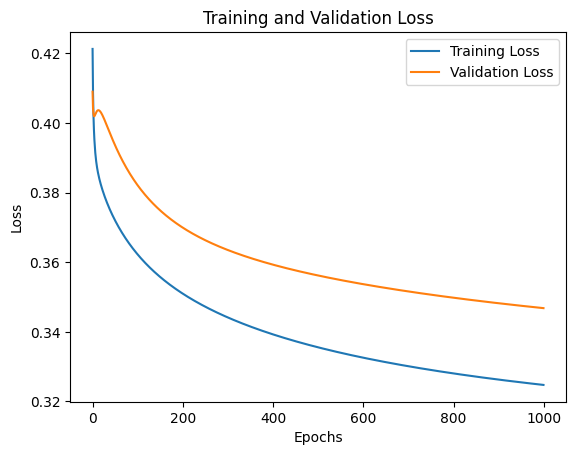

In [86]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()

#se observa un validation loss mult mai bun ,insa am impresia ca inca sunt intr-o zona de 
#overfit,training loss este bun,validaton scade considerabil,fata de celalalt grafic insa tot nu este cea mai buna forma pe care o pot avea 

In [87]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [88]:
y_predicted = predict(x_train, w_final, b_final)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [89]:
y_train.shape

(952, 1)

In [90]:
y_train.reshape(-1).shape, y_predicted.shape

((952,), (952,))

In [91]:
(y_train.reshape(-1) == y_predicted).sum()

834

In [92]:
y_train = y_train.reshape(-1)

In [93]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [94]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 87.61% 
 Precision: 87.90% 
 Recall: 88.60% 
 F1 Score: 88.25% 
 Specificity: 86.50% 
 False Positive Rate: 13.50% 
 False Negative Rate: 11.40%


In [96]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")
#din nou pe training avem un model bun

[TRAIN] Accuracy: 87.61% 
 Precision: 87.90% 
 Recall: 88.60% 
 F1 Score: 88.25% 
 Specificity: 86.50% 
 False Positive Rate: 13.50% 
 False Negative Rate: 11.40%


In [97]:
y_predicted_validation = predict(x_validation, w_final, b_final)

C:\Users\Natalia\AppData\Local\Temp\ipykernel_26436\7029633.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  p[i] = f_wb >= 0.5


In [98]:
y_validation = y_validation.reshape(-1)

In [99]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [100]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 84.03% 
 Precision: 84.21% 
 Recall: 86.82% 
 F1 Score: 85.50% 
 Specificity: 80.73% 
 False Positive Rate: 19.27% 
 False Negative Rate: 13.18%


In [102]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")
#pe acuracy din nou,valorile sunt bune

[VALID] Accuracy: 84.03% 
 Precision: 84.21% 
 Recall: 86.82% 
 F1 Score: 85.50% 
 Specificity: 80.73% 
 False Positive Rate: 19.27% 
 False Negative Rate: 13.18%


### Analyze the feature importance

<Axes: ylabel='Feature'>

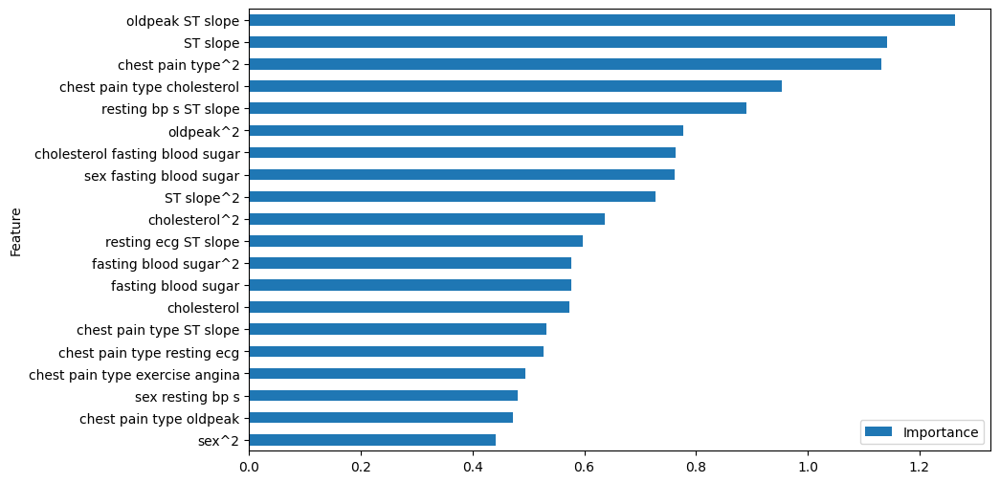

In [103]:
coefficients = copy.deepcopy(w_final)

feature_importance = pd.DataFrame({'Feature': x_data.columns.values, 'Importance': np.abs(coefficients)})
feature_importance = feature_importance.sort_values('Importance', ascending=True)
feature_importance.tail(20).plot(x='Feature', y='Importance', kind='barh', figsize=(10, 6))

#### For example most important feature is obtained by multipling two features: Total day minutes and Customer service calls

### Regularization: 
#### To adjust the overfitting from the previous polynomial model we apply Ridge L2 Regularization

In [104]:
def compute_cost_reg(X, y, w, b, lambda_ = 1):
    m, n = X.shape
    
    # Calls the compute_cost function that you implemented above
    cost_without_reg = compute_cost(X, y, w, b) 
    
    # You need to calculate this value
    reg_cost = 0.
    
    for j in range(n):
      reg_cost += w[j]**2 # Your code here to calculate the cost from w[j]
    
    # Add the regularization cost to get the total cost
    total_cost = cost_without_reg + (lambda_ / (2 * m)) * reg_cost

    return total_cost

In [105]:
def compute_gradient_reg(x_train, y_train, w, b, lambda_=1):
    m, n = x_train.shape
    
    dj_db, dj_dw = compute_gradient(x_train, y_train, w, b)
    
    for j in range(n):
        # Add the regularization term  to the correspoding element of dj_dw
        dj_dw[j] += (lambda_ / m) * w[j] # Your code here to calculate the regularization term for dj_dw[j]
        
    return dj_db, dj_dw

In [106]:
def gradient_descent(x_train, y_train, x_validation, y_validation, w_in, b_in, cost_function, gradient_function, alpha, num_iters, lambda_=1):    
    # number of training examples
    m = len(x_train)
    
    # An array to store cost J and w's at each iteration primarily for graphing later
    J_train_history = []
    J_valid_history = []
    w_history = []

    best_train_score = cost_function(x_train, y_train, w_in, b_in, lambda_)
    best_validation_score = cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
    best_w_in_train = copy.deepcopy(w_in)
    best_b_train = copy.deepcopy(b_in)
    best_w_in_valid = copy.deepcopy(w_in)
    best_b_valid = copy.deepcopy(b_in)
    
    for i in range(num_iters):
        
        # Calculate the gradient and update the parameters
        dj_db, dj_dw = gradient_function(x_train, y_train, w_in, b_in, lambda_)   

        # Update Parameters using w, b, alpha and gradient
        w_in = w_in - alpha * dj_dw               
        b_in = b_in - alpha * dj_db              
        
        cost_train =  cost_function(x_train, y_train, w_in, b_in, lambda_)
        J_train_history.append(cost_train)

        cost_valid =  compute_cost(x_validation, y_validation, w_in, b_in, lambda_)
        J_valid_history.append(cost_valid)

        if best_train_score > cost_train:
            best_train_score = cost_train
            np.save(f'model/best_reg_poly_train_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_reg_poly_train_b.npy', b_in) 


        if best_validation_score > cost_valid:
            best_validation_score = cost_valid
            np.save(f'model/best_reg_poly_valid_w_in.npy', w_in)    # .npy extension is added if not given
            np.save(f'model/best_reg_poly_valid_b.npy', b_in) 
        
        # Print cost every at intervals 10 times or as many iterations if < 10
        if i % math.ceil(num_iters/10) == 0 or i == (num_iters-1):
            w_history.append(w_in)
            print(f"Iteration {i:4}: Cost Train: {float(J_train_history[-1].squeeze()):f} \t  Cost Validation: {float(J_valid_history[-1].squeeze()):f}")
        
    return w_in, b_in, J_train_history, J_valid_history, w_history #return w and J,w history for graphing

In [107]:
np.random.seed(1)
initial_w = np.random.rand(len(x_train[0]))
initial_b = np.random.rand(1)

initial_w = np.zeros(len(x_train[0]))
initial_b = 0

# Some gradient descent settings
iterations = 1000
alpha = 0.3
lambda_ = 7

w_final, b_final, J_train_history, J_valid_history, _ = gradient_descent(x_train=x_train, y_train=y_train, x_validation=x_validation, y_validation=y_validation, w_in=initial_w, b_in=initial_b, cost_function=compute_cost_reg, gradient_function=compute_gradient_reg, alpha=alpha, num_iters=iterations, lambda_=lambda_)

Iteration    0: Cost Train: 0.421995 	  Cost Validation: 0.409017
Iteration  100: Cost Train: 0.368071 	  Cost Validation: 0.383838
Iteration  200: Cost Train: 0.362230 	  Cost Validation: 0.374135
Iteration  300: Cost Train: 0.360005 	  Cost Validation: 0.369590
Iteration  400: Cost Train: 0.359010 	  Cost Validation: 0.366992
Iteration  500: Cost Train: 0.358529 	  Cost Validation: 0.365339
Iteration  600: Cost Train: 0.358285 	  Cost Validation: 0.364223
Iteration  700: Cost Train: 0.358157 	  Cost Validation: 0.363442
Iteration  800: Cost Train: 0.358089 	  Cost Validation: 0.362886
Iteration  900: Cost Train: 0.358052 	  Cost Validation: 0.362485
Iteration  999: Cost Train: 0.358032 	  Cost Validation: 0.362195


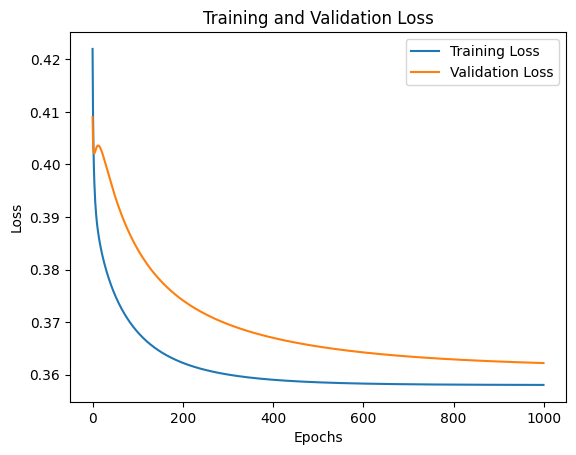

In [108]:
# Generate a sequence of integers to represent the epoch numbers
#epochs = range(1, iterations+1)
 
# Plot and label the training and validation loss values
plt.plot(J_train_history, label='Training Loss')
plt.plot(J_valid_history, label='Validation Loss')
 
# Add in a title and axes labels
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
 
# Set the tick locations
#plt.xticks(np.arange(0, iterations+1, 2))
 
# Display the plot
plt.legend(loc='best')
plt.show()
#la fel,se observa o imbunatatire,trainingul foarte bun,validation scade considerabil
#s-ar putea totusi ca modelul meu sa fie undeva in underfit,deoarece am validation aproape la fel de mic ca si training loss

In [109]:
best_reg_poly_w_final = np.load('model/best_reg_poly_valid_w_in.npy')
best_reg_poly_b_final = np.load('model/best_reg_poly_valid_b.npy')

In [110]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [111]:
y_predicted = predict(x_train, w_final, b_final)

In [112]:
y_train.shape

(952,)

In [113]:
y_train.reshape(-1).shape, y_predicted.shape

((952,), (952,))

In [114]:
(y_train.reshape(-1) == y_predicted).sum()

824

In [115]:
y_train = y_train.reshape(-1)

In [116]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train,
                                                                                                                     y_predicted=y_predicted)

In [117]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 86.55% 
 Precision: 87.05% 
 Recall: 87.40% 
 F1 Score: 87.23% 
 Specificity: 85.62% 
 False Positive Rate: 14.38% 
 False Negative Rate: 12.60%


In [118]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")
#setul meu de training,din nou destul de bun ,inclusiv pe specificity care imi arata cat de bine imi indentific sanatosii.insa totusi
#am un fals neg rate 12.6,valoare bunicica,insa ideal este sa fie cat mai aproape de 0

[TRAIN] Accuracy: 86.55% 
 Precision: 87.05% 
 Recall: 87.40% 
 F1 Score: 87.23% 
 Specificity: 85.62% 
 False Positive Rate: 14.38% 
 False Negative Rate: 12.60%


In [119]:
def predict(X, w, b):
    # number of training examples
    m, n = X.shape   
    p = np.zeros(m)
    
    for i in range(m):   
        z_wb = 0
        # Loop over each feature
        for j in range(n): 
            # Add the corresponding term to z_wb
            z_wb += X[i][j] * w[j]
        
        # Add bias term 
        z_wb += b
        
        # Calculate the prediction for this example
        f_wb = sigmoid(z_wb)

        # Apply the threshold
        p[i] = f_wb >= 0.5
        
    return p

In [120]:
y_predicted_validation = predict(x_validation, w_final, b_final)

In [121]:
y_validation = y_validation.reshape(-1)

In [122]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation,
                                                                                                                     y_predicted=y_predicted_validation)

In [123]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 84.03% 
 Precision: 85.27% 
 Recall: 85.27% 
 F1 Score: 85.27% 
 Specificity: 82.57% 
 False Positive Rate: 17.43% 
 False Negative Rate: 14.73%


In [124]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 84.03% 
 Precision: 85.27% 
 Recall: 85.27% 
 F1 Score: 85.27% 
 Specificity: 82.57% 
 False Positive Rate: 17.43% 
 False Negative Rate: 14.73%


### Decision Tree 
#### Specialized in learning non-linear data
#### No need for Normalization/Standardization
#### No need for Polynomial Feature Transformation

In [126]:
x_data = data.drop(columns=['target'])

### Split data into training and validation datasets: Default 80% train, 20% validation

In [127]:
def train_validation_split(x, y, validation_size=0.2, random_state=None):
    x_validation = x.sample(frac=validation_size, random_state=random_state)
    y_validation = y.iloc[x_validation.index]
    
    x_train = x.drop(x_validation.index)
    y_train = y.drop(y_validation.index)

    return np.array(x_train), np.array(y_train), np.array(x_validation), np.array(y_validation)

In [128]:
x_train, y_train, x_validation, y_validation = train_validation_split(x_data, y_data, validation_size=0.2, random_state=0)

### Visualize how one sample looks like

In [129]:
x_train[0]

array([ 12.,   1.,   2., 140., 289.,   0.,   0., 172.,   0.,   0.,   1.])

### Visualize the nuber of training samples and number of validation samples

In [130]:
len(y_train), len(y_validation)

(952, 238)

### Visualize the number of no churn vs churn samples in training dataset

#### Having 85.8% samples with no churn and 14.2% samples with churn in our dataset
#### So we have a ratio of 6 no churn samples to 1 churn sample
#### Our training and validation dataset should respect this ratio approximately

In [131]:
np.unique(y_train, return_counts=True)

(array([0, 1], dtype=int8), array([452, 500], dtype=int64))

#### 456 samples of 0 (no churn) and 78 samples of 1 (churn)
#### 78 * 6 = 468

### Visualize the number of no churn vs churn samples in validation dataset

#### 116 samples of 0 (no churn) and 17 samples of 1 (churn)
#### 17 * 6 = 102

In [138]:
np.unique(y_validation, return_counts=True)

(array([0, 1], dtype=int8), array([109, 129], dtype=int64))

### Decision Tree Code and Implementation

In [144]:
class Node:
    def __init__(self, feature_index=None, threshold=None, left=None, right=None, info_gain=None, value=None):
        """Constructor"""
        # for decision node
        self.feature_index = feature_index
        self.threshold = threshold
        self.left = left
        self.right = right
        self.info_gain = info_gain
        # for leaf node
        self.value = value

In [149]:
class DecisionTreeClassifier():
    def __init__(self, min_samples_split=2, max_depth=2):
        ''' constructor '''
        self.root = None
        self.min_samples_split = min_samples_split
        self.max_depth = max_depth
        
    def build_tree(self, dataset, curr_depth=0):
        ''' recursive function to build the tree '''
        X, Y = dataset[:,:-1], dataset[:,-1]
        num_samples, num_features = np.shape(X)
        
        if num_samples >= self.min_samples_split and curr_depth <= self.max_depth:
            best_split = self.get_best_split(dataset, num_samples, num_features)
            if best_split["info_gain"] > 0:
                left_subtree = self.build_tree(best_split["dataset_left"], curr_depth+1)
                right_subtree = self.build_tree(best_split["dataset_right"], curr_depth+1)
                return Node(best_split["feature_index"], best_split["threshold"], 
                            left_subtree, right_subtree, best_split["info_gain"])
        
        leaf_value = self.calculate_leaf_value(Y)
        return Node(value=leaf_value)
    
    def get_best_split(self, dataset, num_samples, num_features):
        ''' function to find the best split '''
        best_split = {
            "feature_index": None,
            "threshold": None,
            "dataset_left": None,
            "dataset_right": None,
            "info_gain": -float('inf')
        }
        
        for feature_index in range(num_features):
            feature_values = dataset[:, feature_index]
            possible_thresholds = np.unique(feature_values)
            for threshold in possible_thresholds:
                dataset_left, dataset_right = self.split(dataset, feature_index, threshold)
                if len(dataset_left) > 0 and len(dataset_right) > 0:
                    y, left_y, right_y = dataset[:, -1], dataset_left[:, -1], dataset_right[:, -1]
                    curr_info_gain = self.information_gain(y, left_y, right_y, "entropy")
                    if curr_info_gain > best_split["info_gain"]:
                        best_split["feature_index"] = feature_index
                        best_split["threshold"] = threshold
                        best_split["dataset_left"] = dataset_left
                        best_split["dataset_right"] = dataset_right
                        best_split["info_gain"] = curr_info_gain
                        
        return best_split
    
    def split(self, dataset, feature_index, threshold):
        ''' function to split the data '''
        dataset_left = np.array([row for row in dataset if row[feature_index] <= threshold])
        dataset_right = np.array([row for row in dataset if row[feature_index] > threshold])
        return dataset_left, dataset_right
    
    def information_gain(self, parent, l_child, r_child, mode="entropy"):
        ''' function to compute information gain '''
        weight_l = len(l_child) / len(parent)
        weight_r = len(r_child) / len(parent)
        if mode == "gini":
            gain = self.gini_index(parent) - (weight_l * self.gini_index(l_child) + weight_r * self.gini_index(r_child))
        else:
            gain = self.entropy(parent) - (weight_l * self.entropy(l_child) + weight_r * self.entropy(r_child))
        return gain
    
    def entropy(self, y):
        ''' function to compute entropy '''
        class_labels = np.unique(y)
        entropy = 0
        for cls in class_labels:
            p_cls = len(y[y == cls]) / len(y)
            entropy += -p_cls * np.log2(p_cls)
        return entropy
    
    def gini_index(self, y):
        ''' function to compute gini index '''
        class_labels = np.unique(y)
        gini = 0
        for cls in class_labels:
            p_cls = len(y[y == cls]) / len(y)
            gini += p_cls**2
        return 1 - gini
        
    def calculate_leaf_value(self, Y):
        ''' function to compute leaf node '''
        Y = list(Y)
        return max(Y, key=Y.count)
    
    def print_tree(self, features, tree=None, indent=" "):
        ''' function to print the tree '''
        if not tree:
            tree = self.root

        if tree.value is not None:
            print(tree.value)
        else:
            print(features[tree.feature_index], "<=", tree.threshold, "?", tree.info_gain)
            print("%sleft:" % (indent), end="")
            self.print_tree(features, tree.left, indent + indent)
            print("%sright:" % (indent), end="")
            self.print_tree(features, tree.right, indent + indent)
    
    def fit(self, X, Y):
        ''' function to train the tree '''
        Y = Y.reshape(-1, 1)  # Ensure Y is a column vector
        dataset = np.concatenate((X, Y), axis=1)
        self.root = self.build_tree(dataset)
    
    def predict(self, X):
        ''' function to predict new dataset '''
        predictions = [self.make_prediction(x, self.root) for x in X]
        return predictions
    
    def make_prediction(self, x, tree):
        ''' function to predict a single data point '''
        if tree.value is not None:
            return tree.value
        feature_val = x[tree.feature_index]
        if feature_val <= tree.threshold:
            return self.make_prediction(x, tree.left)
        else:
            return self.make_prediction(x, tree.right)


#### Declare Decision Tree with corresponding Hyperparameters

In [150]:
classifier = DecisionTreeClassifier(min_samples_split=2, max_depth=7)

In [151]:
type(x_train)

numpy.ndarray

#### Train the Decision Tree

In [153]:
classifier.fit(x_train, y_train)

#### Predict on the training dataset 

In [154]:
y_predicted = classifier.predict(x_train)
y_predicted = np.array(y_predicted)

### Display training metrics

In [155]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [156]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 94.85% 
 Precision: 93.96% 
 Recall: 96.40% 
 F1 Score: 95.16% 
 Specificity: 93.14% 
 False Positive Rate: 6.86% 
 False Negative Rate: 3.60%


In [157]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 94.85% 
 Precision: 93.96% 
 Recall: 96.40% 
 F1 Score: 95.16% 
 Specificity: 93.14% 
 False Positive Rate: 6.86% 
 False Negative Rate: 3.60%


### Display validation metrics

In [158]:
y_predicted_valid = classifier.predict(x_validation)
y_predicted_valid = np.array(y_predicted_valid)

In [159]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [160]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 84.87% 
 Precision: 86.61% 
 Recall: 85.27% 
 F1 Score: 85.94% 
 Specificity: 84.40% 
 False Positive Rate: 15.60% 
 False Negative Rate: 14.73%


In [161]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[VALID] Accuracy: 84.87% 
 Precision: 86.61% 
 Recall: 85.27% 
 F1 Score: 85.94% 
 Specificity: 84.40% 
 False Positive Rate: 15.60% 
 False Negative Rate: 14.73%


### Display Decision Tree and Learned rules by the Tree 

In [162]:
list(x_data.columns)

['age',
 'sex',
 'chest pain type',
 'resting bp s',
 'cholesterol',
 'fasting blood sugar',
 'resting ecg',
 'max heart rate',
 'exercise angina',
 'oldpeak',
 'ST slope']

In [163]:
classifier.print_tree(features=list(x_data.columns))

ST slope <= 1.0 ? 0.26467350244384036
 left:chest pain type <= 3.0 ? 0.11888054812862936
  left:oldpeak <= 2.0 ? 0.06510814361769063
    left:age <= 28.0 ? 0.041798360301731285
        left:resting bp s <= 190.0 ? 0.05174316235229451
                left:cholesterol <= 149.0 ? 0.05707045979429193
                                left:max heart rate <= 127.0 ? 0.954434002924965
                                                                left:1.0
                                                                right:0.0
                                right:resting bp s <= 108.0 ? 0.0207202027232979
                                                                left:resting bp s <= 106.0 ? 0.14339080881725613
                                                                                                                                left:0.0
                                                                                                                                right:0.0
     

In [164]:
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score

cf= DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=0)  
cf.fit(x_train, y_train)  

DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=0)

In [165]:
y_predicted = cf.predict(x_train) 

In [166]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_train,
                                                                                                                     y_true=y_train.reshape(-1),
                                                                                                                     y_predicted=y_predicted)

In [167]:
print(f"[TRAIN] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")

[TRAIN] Accuracy: 87.71% 
 Precision: 87.48% 
 Recall: 89.40% 
 F1 Score: 88.43% 
 Specificity: 85.84% 
 False Positive Rate: 14.16% 
 False Negative Rate: 10.60%


In [168]:
y_predicted_valid = cf.predict(x_validation)
accuracy_score(y_validation, y_predicted_valid)

0.8109243697478992

In [169]:
(accuracy, precision, recall, specificity, f1_score, false_negative_rate, false_positive_rate) = metrics_computations(x=x_validation,
                                                                                                                     y_true=y_validation.reshape(-1),
                                                                                                                     y_predicted=y_predicted_valid)

In [171]:
print(f"[VALID] Accuracy: {(accuracy * 100.):.2f}% \n Precision: {(precision * 100):.2f}% \n Recall: {(recall * 100):.2f}% \n F1 Score: {(f1_score * 100.):.2f}% \n Specificity: {(specificity * 100):.2f}% \n False Positive Rate: {(false_positive_rate * 100):.2f}% \n False Negative Rate: {(false_negative_rate * 100):.2f}%")
#f1 score destul de bun,false negative rate a crescut,la fel si fals poz

[VALID] Accuracy: 81.09% 
 Precision: 82.31% 
 Recall: 82.95% 
 F1 Score: 82.63% 
 Specificity: 78.90% 
 False Positive Rate: 21.10% 
 False Negative Rate: 17.05%


In [172]:
from sklearn.tree import plot_tree


In [173]:
fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize=(70,50), dpi=300)
plot_tree(cf, filled=True, fontsize=20, feature_names=list(x_data.columns),rounded=True, ax=axes)
plt.savefig('decisionTree.png')

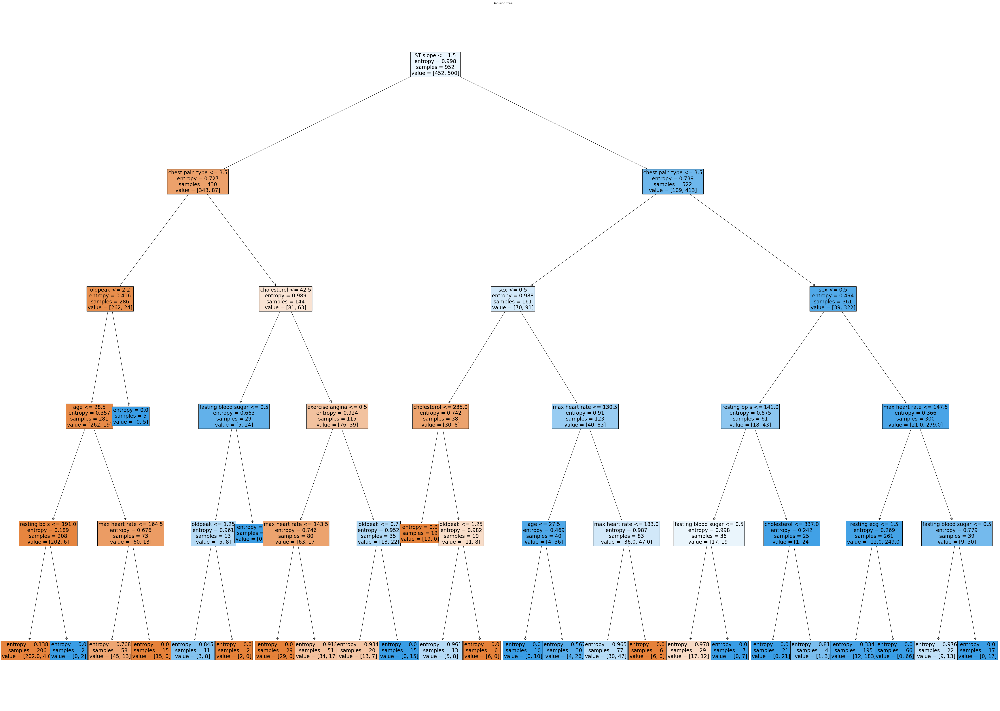

In [175]:
plt.figure(figsize=(70,50))  # set plot size (denoted in inches)
plot_tree(cf, filled=True, fontsize=20, feature_names=list(x_data.columns))
plt.title("Decision tree")
plt.show()

In [178]:
text_representation = export_text(cf, feature_names=list(x_data.columns), class_names=['No Target', 'Target'])
print(text_representation)

|--- ST slope <= 1.50
|   |--- chest pain type <= 3.50
|   |   |--- oldpeak <= 2.20
|   |   |   |--- age <= 28.50
|   |   |   |   |--- resting bp s <= 191.00
|   |   |   |   |   |--- class: No Target
|   |   |   |   |--- resting bp s >  191.00
|   |   |   |   |   |--- class: Target
|   |   |   |--- age >  28.50
|   |   |   |   |--- max heart rate <= 164.50
|   |   |   |   |   |--- class: No Target
|   |   |   |   |--- max heart rate >  164.50
|   |   |   |   |   |--- class: No Target
|   |   |--- oldpeak >  2.20
|   |   |   |--- class: Target
|   |--- chest pain type >  3.50
|   |   |--- cholesterol <= 42.50
|   |   |   |--- fasting blood sugar <= 0.50
|   |   |   |   |--- oldpeak <= 1.25
|   |   |   |   |   |--- class: Target
|   |   |   |   |--- oldpeak >  1.25
|   |   |   |   |   |--- class: No Target
|   |   |   |--- fasting blood sugar >  0.50
|   |   |   |   |--- class: Target
|   |   |--- cholesterol >  42.50
|   |   |   |--- exercise angina <= 0.50
|   |   |   |   |--- max hear